In [1]:
! pip install pydicom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 8.0 MB/s 


In [8]:
import pydicom
from pydicom.pixel_data_handlers.util import apply_modality_lut
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
%matplotlib inline

In [9]:
!wget 'https://raw.githubusercontent.com/sauravmishra1710/Bio-Medical-Image-Analysis-with-DICOMs/main/data/CT%20Medical%20Images/ID_0000_AGE_0060_CONTRAST_1_CT.dcm'

--2022-08-18 06:54:01--  https://raw.githubusercontent.com/sauravmishra1710/Bio-Medical-Image-Analysis-with-DICOMs/main/data/CT%20Medical%20Images/ID_0000_AGE_0060_CONTRAST_1_CT.dcm
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 528130 (516K) [application/octet-stream]
Saving to: ‘ID_0000_AGE_0060_CONTRAST_1_CT.dcm.1’

ID_0000_AGE_0060_CO 100%[===================>] 515.75K  --.-KB/s    in 0.005s  

2022-08-18 06:54:01 (109 MB/s) - ‘ID_0000_AGE_0060_CONTRAST_1_CT.dcm.1’ saved [528130/528130]



In [10]:
path = '/content/ID_0000_AGE_0060_CONTRAST_1_CT.dcm'

In [23]:
dicom = pydicom.read_file(path)
dicom

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 194
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.14519.5.2.1.7777.9002.108821836759549281694712274169
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'dcm4che-1.4.31'
-------------------------------------------------
(0008, 0000) Group Length                        UL: 430
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.3.6.1.4.1.14519.5.2.1.7777.9002.1088

In [24]:
image = dicom.pixel_array
image

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

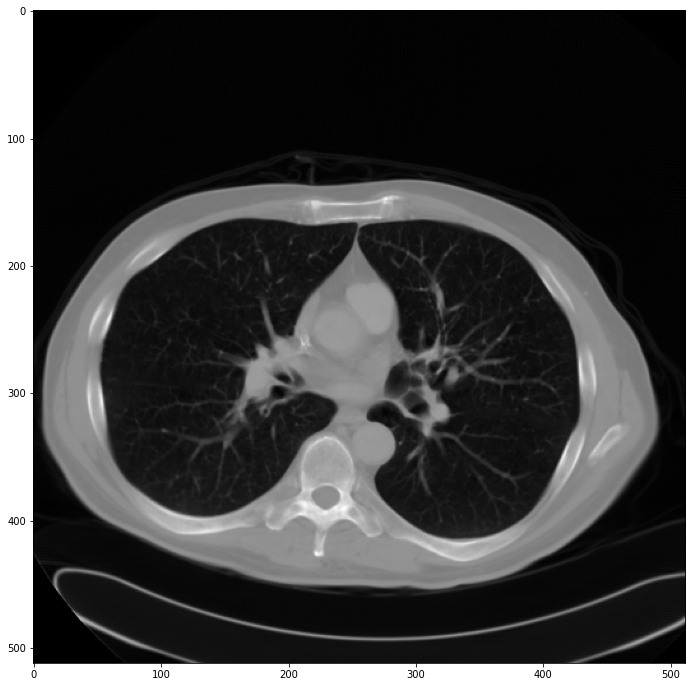

In [25]:
plt.figure(figsize = (12,12))
plt.imshow(image, 'gray');

In [26]:
hu_image = apply_modality_lut(image, dicom)

In [20]:
print(hu_image.min(), hu_image.max())

-1024.0 894.0


In [16]:
histogram, bin_edges = np.histogram(hu_image, bins=256, range=(hu_image.min(), hu_image.max()))

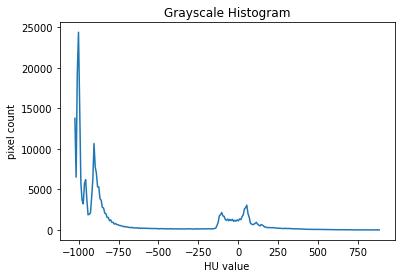

In [17]:
# configure and draw the histogram figure
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("HU value")
plt.ylabel("pixel count")

plt.plot(bin_edges[0:-1], histogram)  # <- or here
plt.show()

## Filters

### remove noise

1. Mean filter
2. Median filter
3. Gaussian filter

## Add noise

In [27]:
hu_image.shape

(512, 512)

In [28]:
hu_image[490:,490:]

array([[ -349.,  -510.,  -649.,  -800.,  -912.,  -971.,  -973.,  -997.,
        -1024.,  -983.,  -964.,  -975.,  -967.,  -954.,  -949.,  -940.,
         -887., -1024., -1024., -1024., -1024., -1024.],
       [ -702.,  -831.,  -912.,  -948.,  -973.,  -980.,  -997.,  -971.,
         -956.,  -980.,  -986.,  -968.,  -965.,  -952.,  -964.,  -948.,
        -1024., -1024., -1024., -1024., -1024., -1024.],
       [ -952.,  -980., -1023., -1021.,  -998.,  -987.,  -996., -1006.,
         -983.,  -981.,  -969.,  -968.,  -955.,  -967.,  -919., -1024.,
        -1024., -1024., -1024., -1024., -1024., -1024.],
       [ -980.,  -978.,  -946.,  -949.,  -978.,  -976.,  -961.,  -969.,
         -976.,  -961.,  -966.,  -968.,  -960.,  -935., -1024., -1024.,
        -1024., -1024., -1024., -1024., -1024., -1024.],
       [ -962.,  -983., -1007.,  -992.,  -976.,  -975.,  -972.,  -949.,
         -954.,  -961.,  -957.,  -948.,  -924., -1024., -1024., -1024.,
        -1024., -1024., -1024., -1024., -1024., -102

In [30]:
hu_image[490:,490:] = 0
hu_image[490:,490:]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,

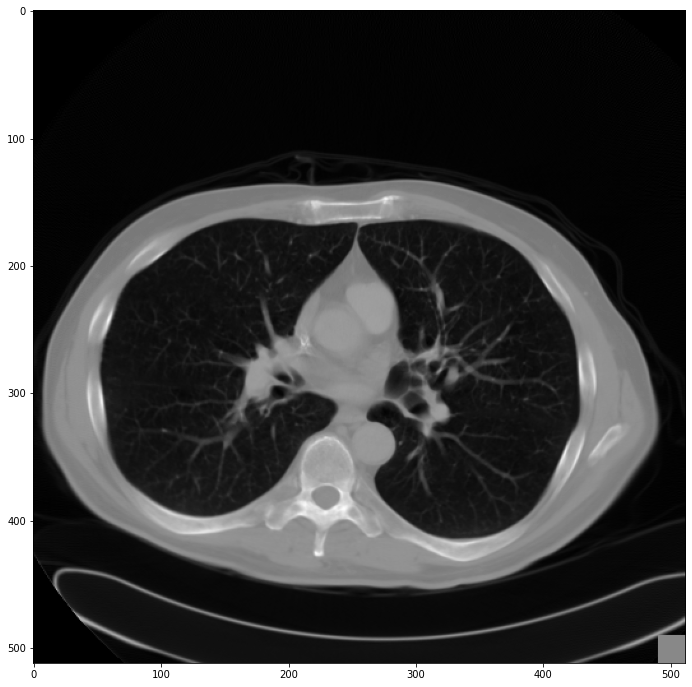

In [31]:
plt.figure(figsize = (12,12))
plt.imshow(hu_image, 'gray');

In [32]:
import cv2

In [33]:
# mean filter
blur = cv2.blur(hu_image,(5,5))

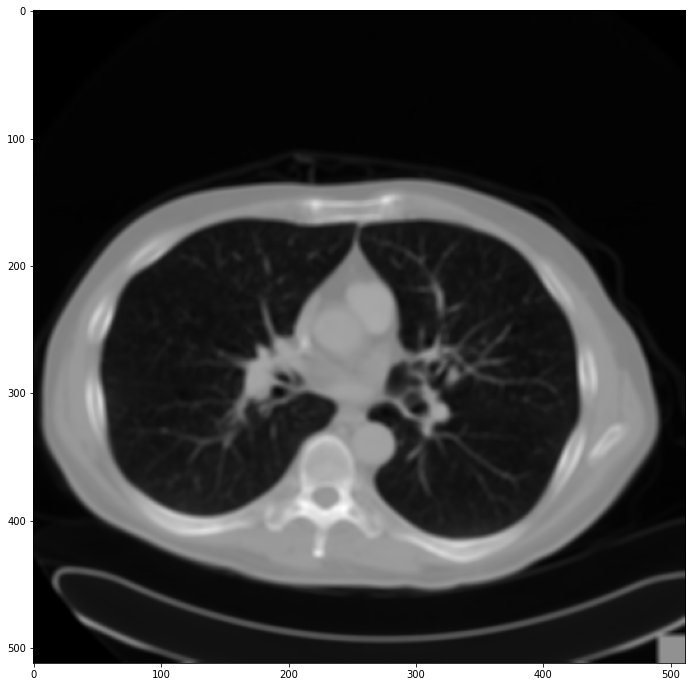

In [34]:
plt.figure(figsize = (12,12))
plt.imshow(blur, 'gray');

In [35]:
def plot_result(image,kernel_size):
    fig = plt.figure(figsize=(15,15));
    grid = ImageGrid(fig, 111, nrows_ncols=(1,2), axes_pad=0.5);

    grid[0].imshow(image, 'gray')
    grid[0].set_title('image', fontsize=15)
    grid[0].axis('off')

    blur = cv2.blur(image,(kernel_size,kernel_size))
    grid[1].imshow(blur, 'gray')
    grid[1].set_title(f'mean filter with kernel size : {kernel_size}', fontsize=15)
    grid[1].axis('off')


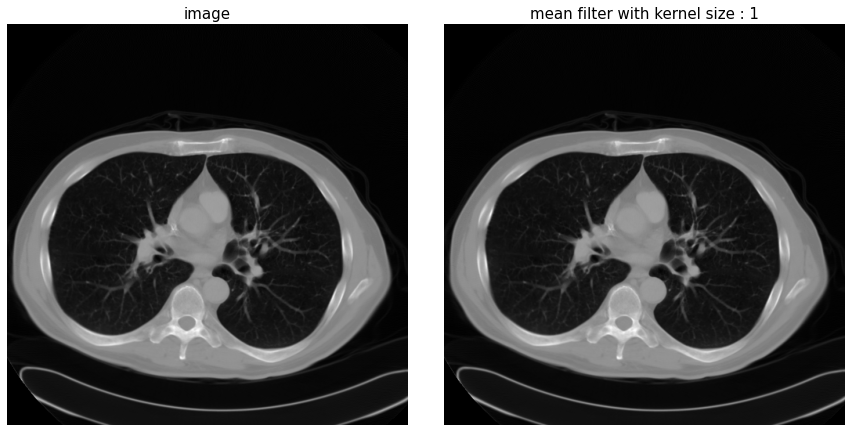

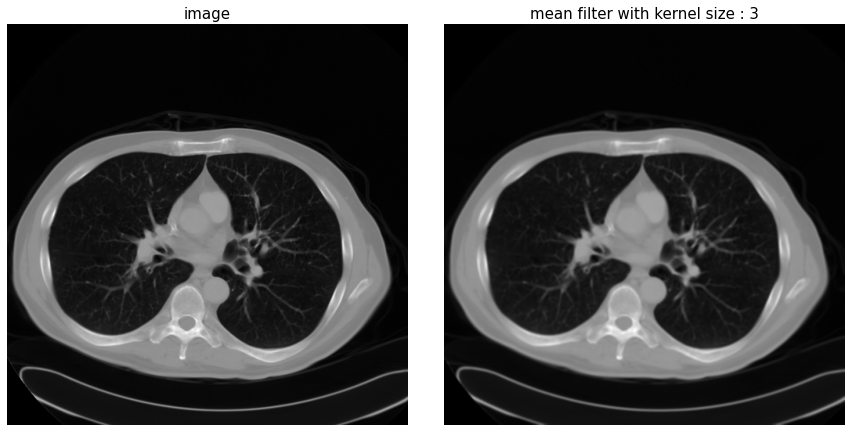

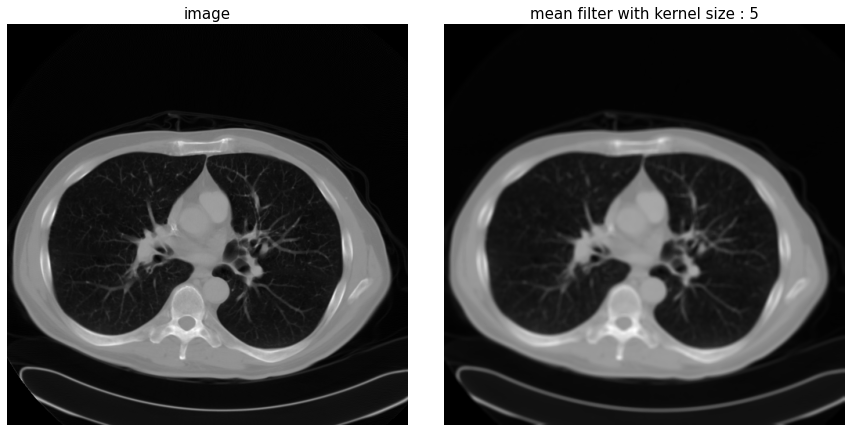

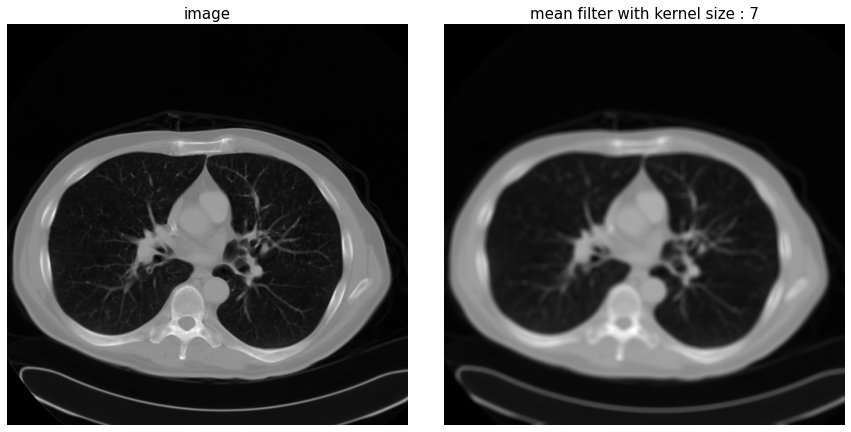

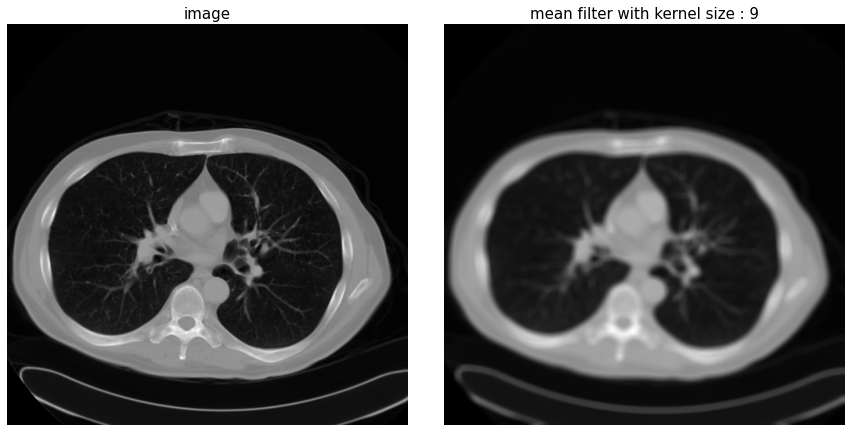

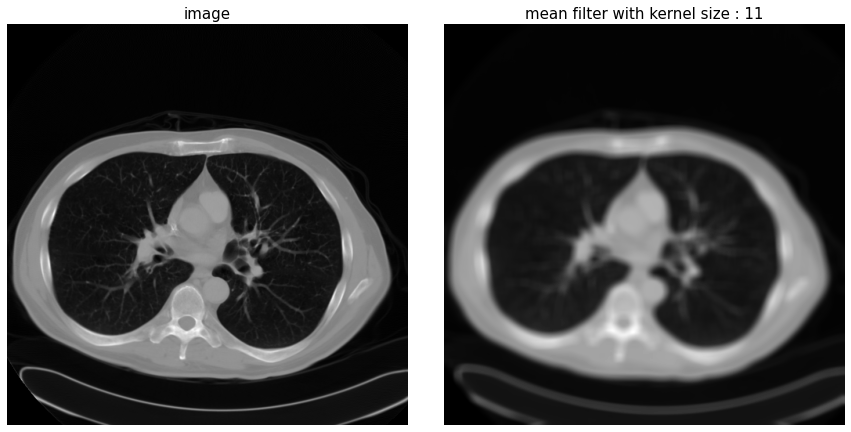

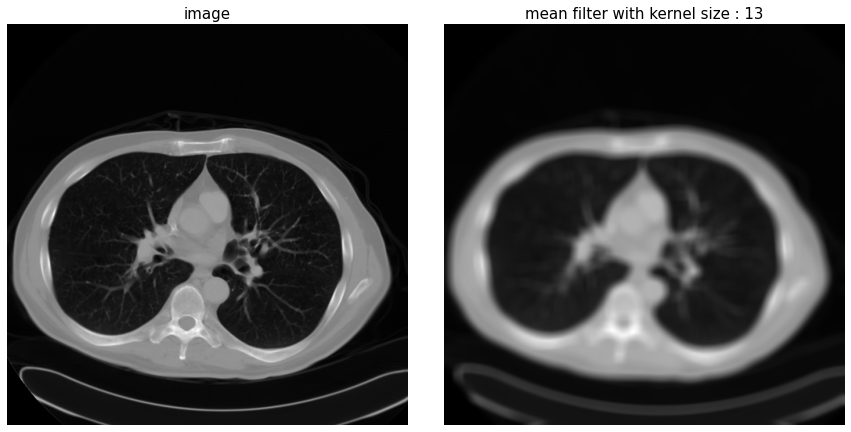

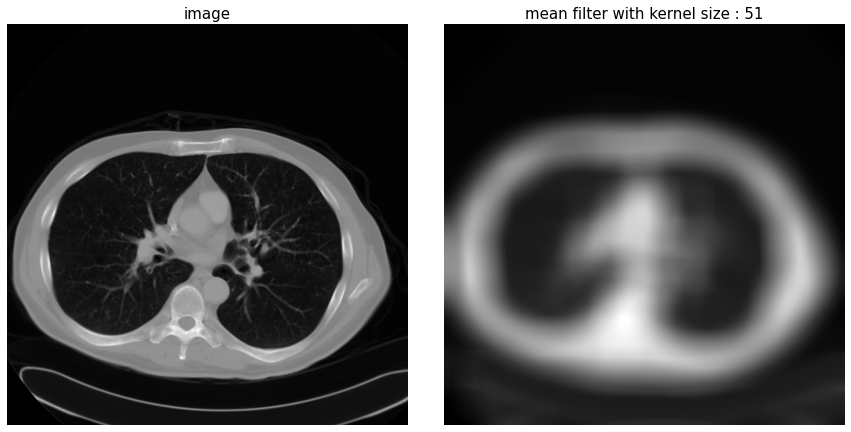

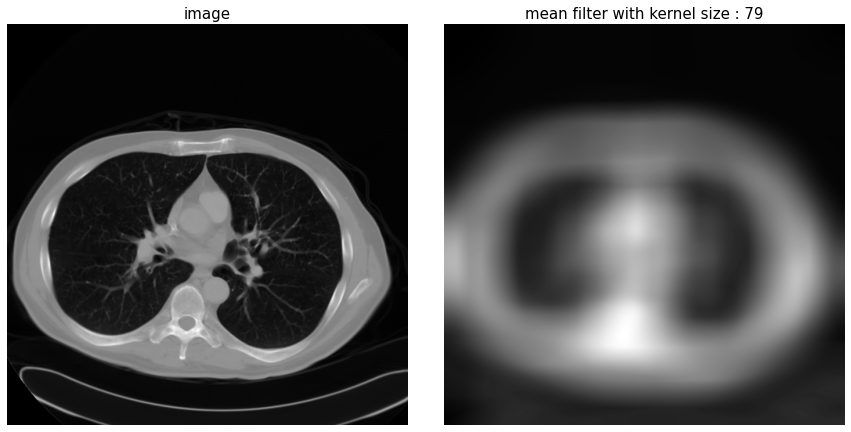

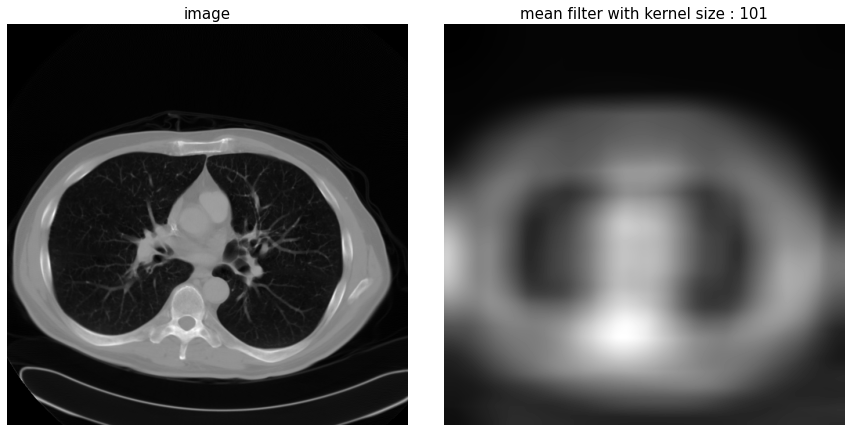

In [36]:
for kernel_size in [1,3,5,7,9,11,13,51,79,101]:
    plot_result(image,kernel_size)

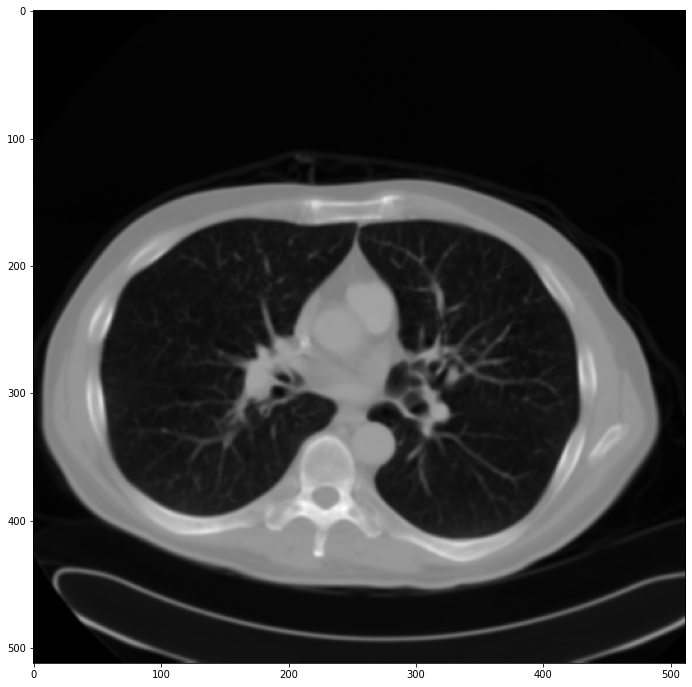

In [ ]:
# gissiam filter
blur = cv2.GaussianBlur(image,(5,5),0)
plt.figure(figsize = (12,12))
plt.imshow(blur, 'gray');

In [ ]:
def plot_result(image,kernel_size):
    fig = plt.figure(figsize=(15,15));
    grid = ImageGrid(fig, 111, nrows_ncols=(1,2), axes_pad=0.5);

    grid[0].imshow(image, 'gray')
    grid[0].set_title('image', fontsize=15)
    grid[0].axis('off')

    blur = cv2.GaussianBlur(image,(kernel_size,kernel_size),0)
    grid[1].imshow(blur, 'gray')
    grid[1].set_title(f'Gaussian filter with kernel size : {kernel_size}', fontsize=15)
    grid[1].axis('off')


In [ ]:
for kernel_size in [1,3,5,7,9,11,13,51,79,101]:
    plot_result(image,kernel_size)

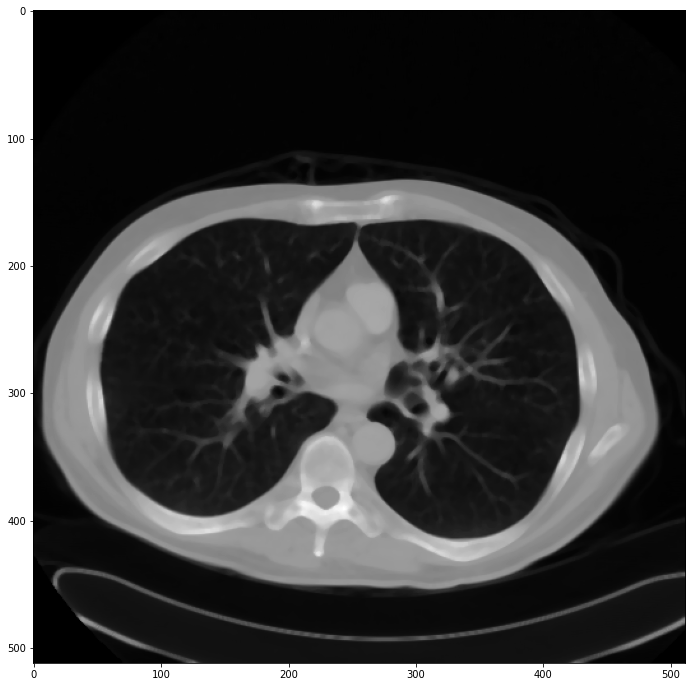

In [ ]:
# median filter
blur = cv2.medianBlur(image,5)
plt.figure(figsize = (12,12))
plt.imshow(blur, 'gray');

In [ ]:
def plot_result(image,kernel_size):
    fig = plt.figure(figsize=(15,15));
    grid = ImageGrid(fig, 111, nrows_ncols=(1,2), axes_pad=0.5);

    grid[0].imshow(image, 'gray')
    grid[0].set_title('image', fontsize=15)
    grid[0].axis('off')

    blur = cv2.medianBlur(image,kernel_size)
    grid[1].imshow(blur, 'gray')
    grid[1].set_title(f'median filter with kernel size : {kernel_size}', fontsize=15)
    grid[1].axis('off')


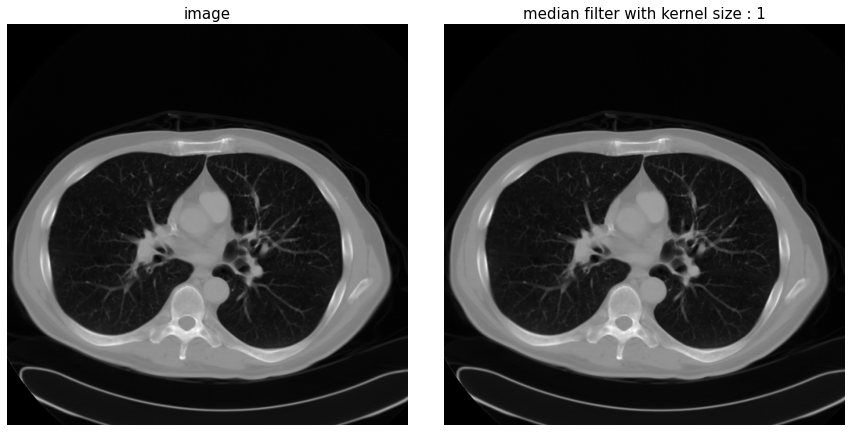

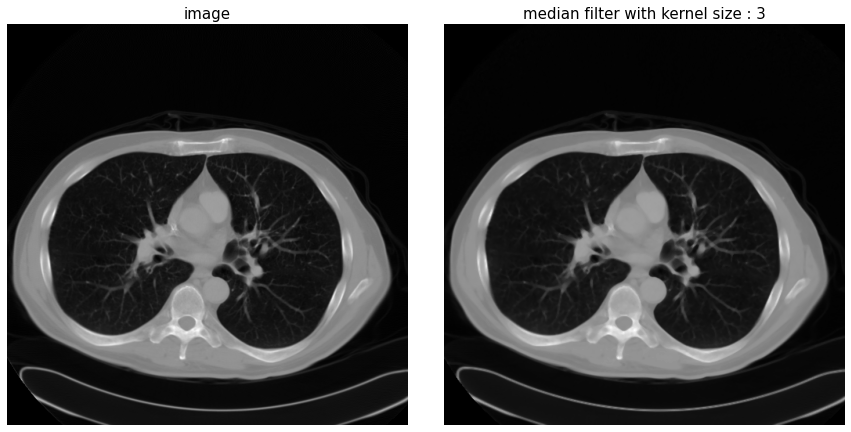

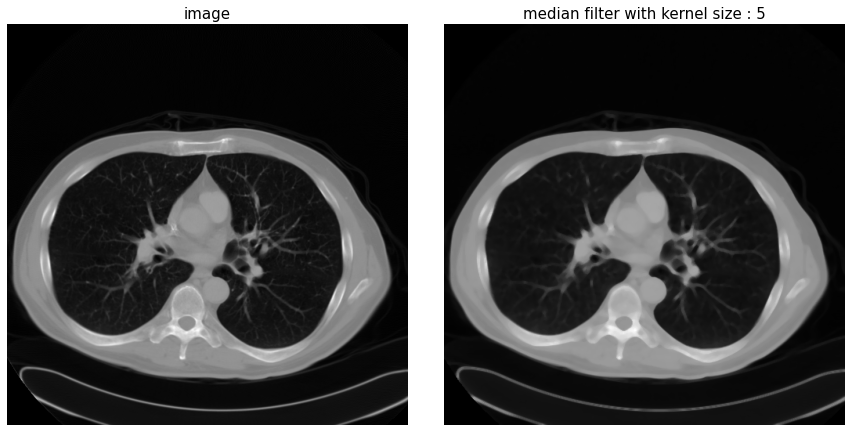

In [ ]:
for kernel_size in [1,3,5]:
    plot_result(image,kernel_size)

### find edges

In [22]:
from skimage import filters

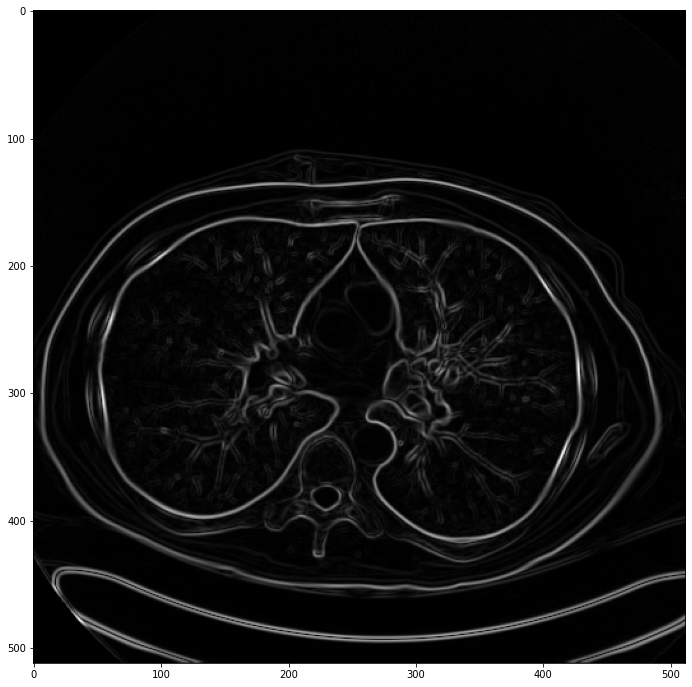

In [ ]:
# prewitt filter
edge_map = filters.prewitt(image)
plt.figure(figsize = (12,12))
plt.imshow(edge_map, 'gray');

In [ ]:
edge_map.shape

(512, 512)

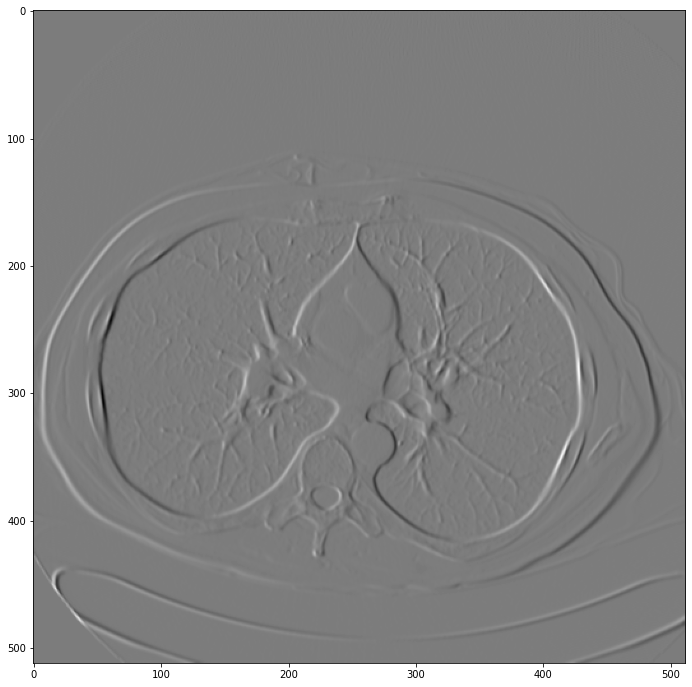

In [ ]:
# prewitt filter
edge_map = filters.prewitt_v(image)
plt.figure(figsize = (12,12))
plt.imshow(edge_map, 'gray');

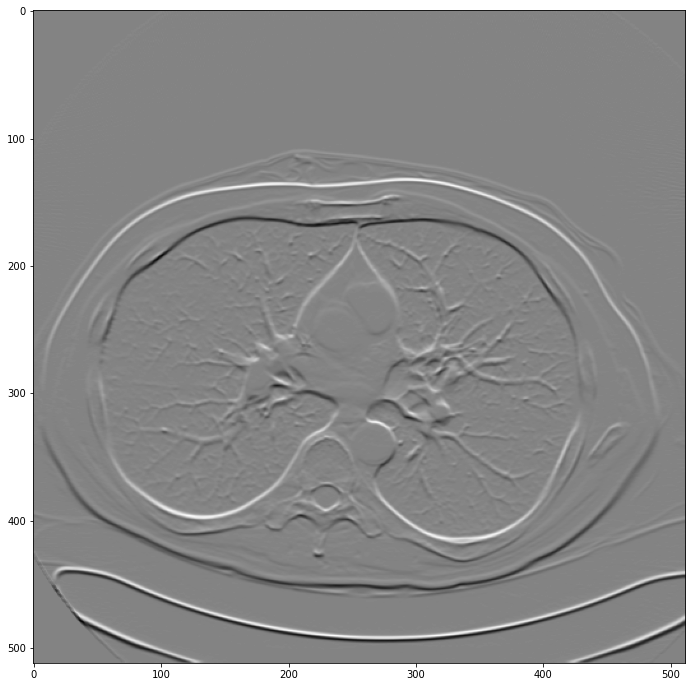

In [ ]:
# prewitt filter
edge_map = filters.prewitt_h(image)
plt.figure(figsize = (12,12))
plt.imshow(edge_map, 'gray');

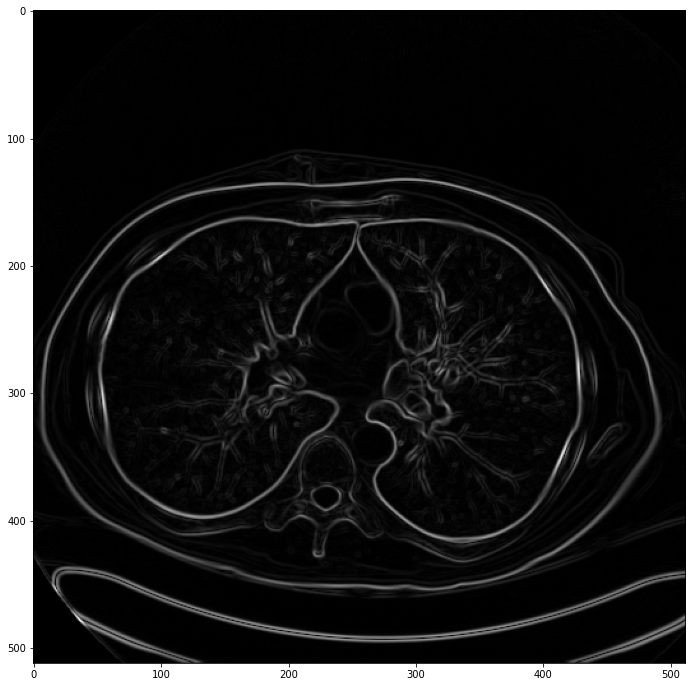

In [ ]:
# sobel filter
edge_map = filters.sobel(image)
plt.figure(figsize = (12,12))
plt.imshow(edge_map, 'gray');

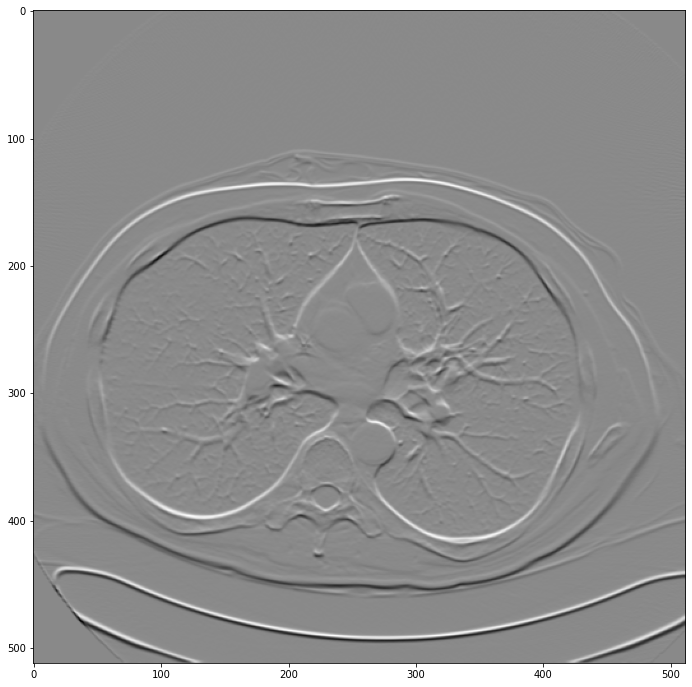

In [ ]:
# sobel filter
edge_map = filters.sobel_h(image)
plt.figure(figsize = (12,12))
plt.imshow(edge_map, 'gray');

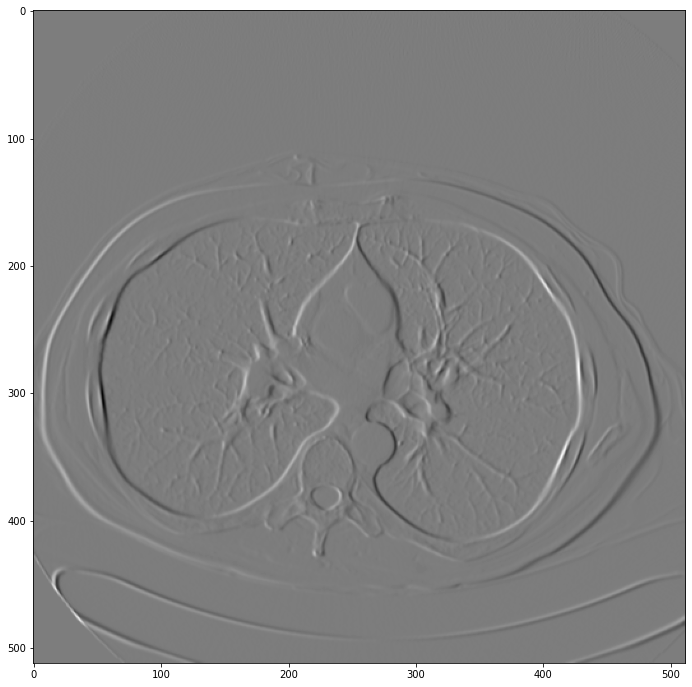

In [ ]:
# sobel filter
edge_map = filters.sobel_v(image)
plt.figure(figsize = (12,12))
plt.imshow(edge_map, 'gray');

## segmentation

In [24]:
histogram, bin_edges = np.histogram(image, bins=256, range=(image.min(), image.max()))

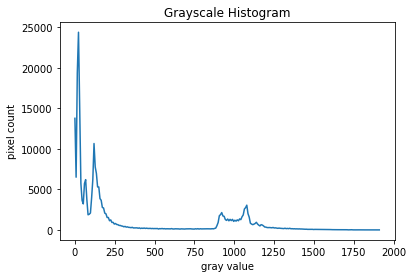

In [25]:
# configure and draw the histogram figure
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("gray value")
plt.ylabel("pixel count")

plt.plot(bin_edges[0:-1], histogram)  
plt.show()

threshold : 333.656925201416


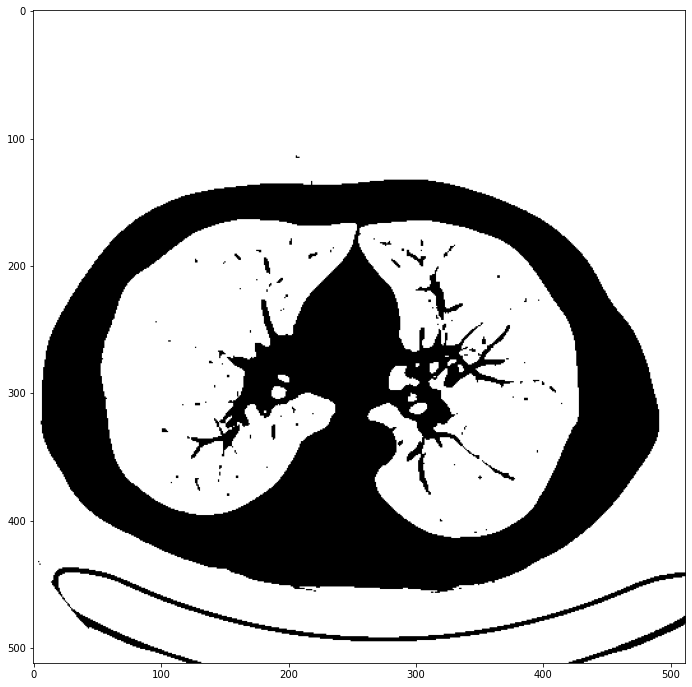

In [ ]:
# mean threshold
t = filters.threshold_mean(image)
print(f'threshold : {t}')
segment_image = np.where(image > t,0,255)
plt.figure(figsize = (12,12))
plt.imshow(segment_image, 'gray');

threshold : 571


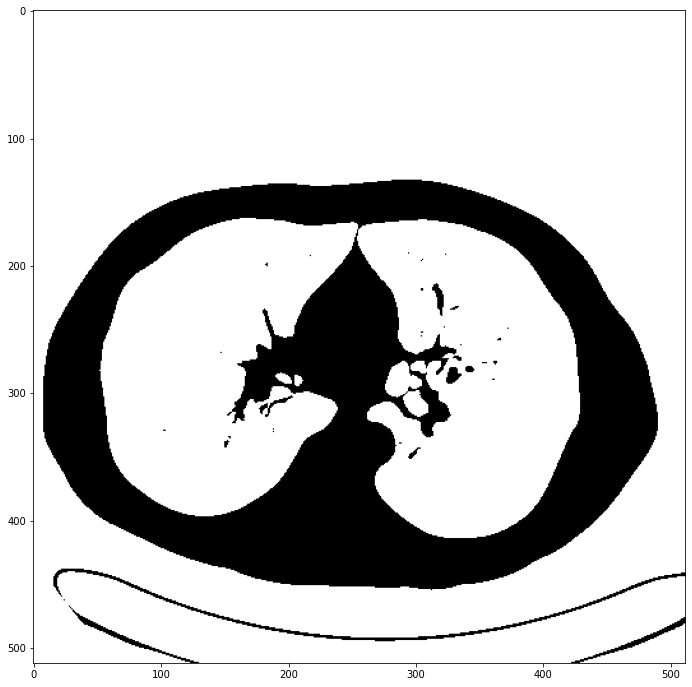

In [ ]:
# otsu threshold
t = filters.threshold_otsu(image)
print(f'threshold : {t}')
segment_image = np.where(image > t,0,255)
plt.figure(figsize = (12,12))
plt.imshow(segment_image, 'gray');

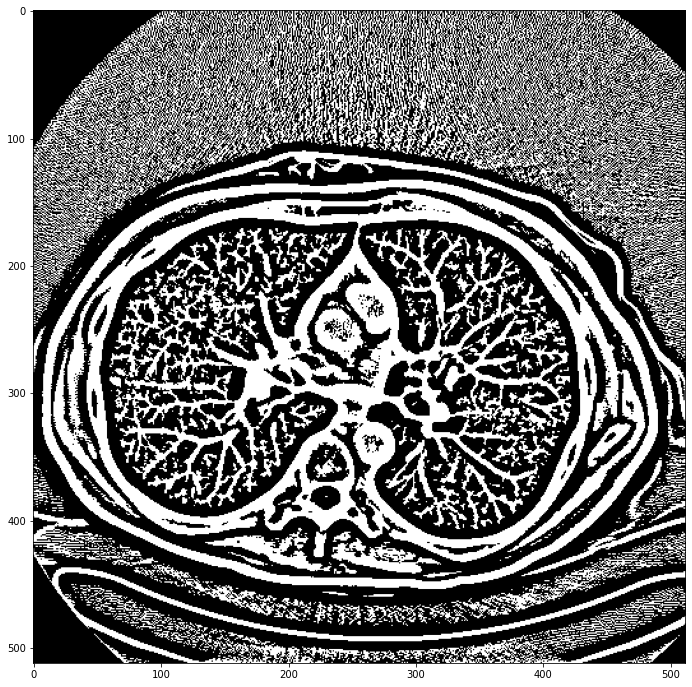

In [ ]:
segment_image = image > filters.threshold_local(image, 15, 'mean')
plt.figure(figsize = (12,12))
plt.imshow(segment_image, 'gray');

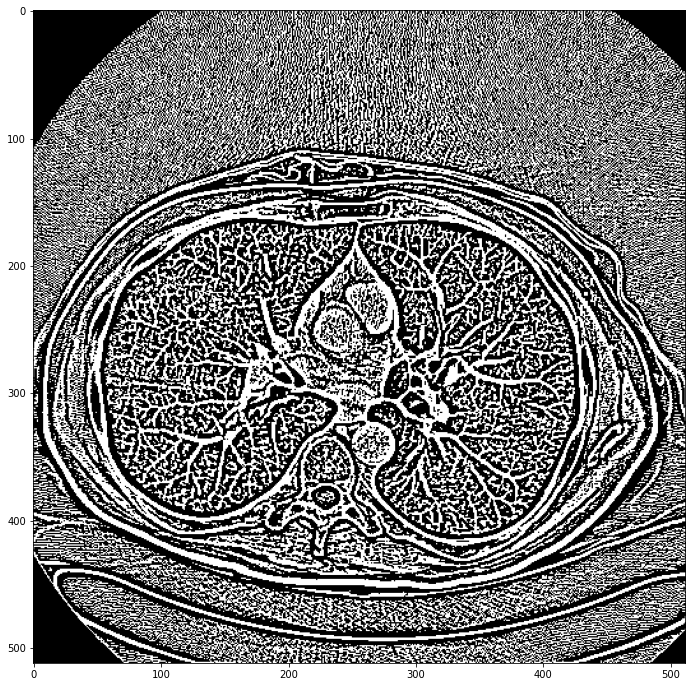

In [ ]:
segment_image = image > filters.threshold_local(image, 5, 'mean')
plt.figure(figsize = (12,12))
plt.imshow(segment_image, 'gray');

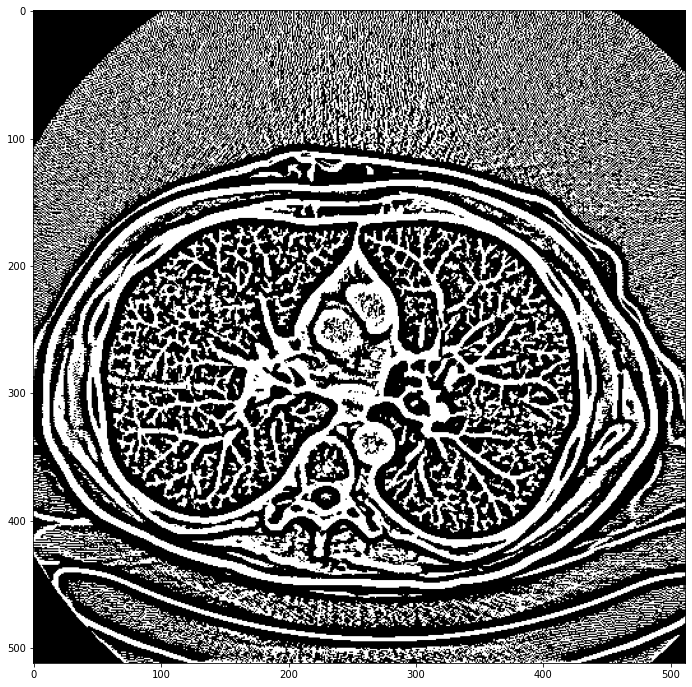

In [ ]:
segment_image = image > filters.threshold_local(image, 11, 'mean')
plt.figure(figsize = (12,12))
plt.imshow(segment_image, 'gray');

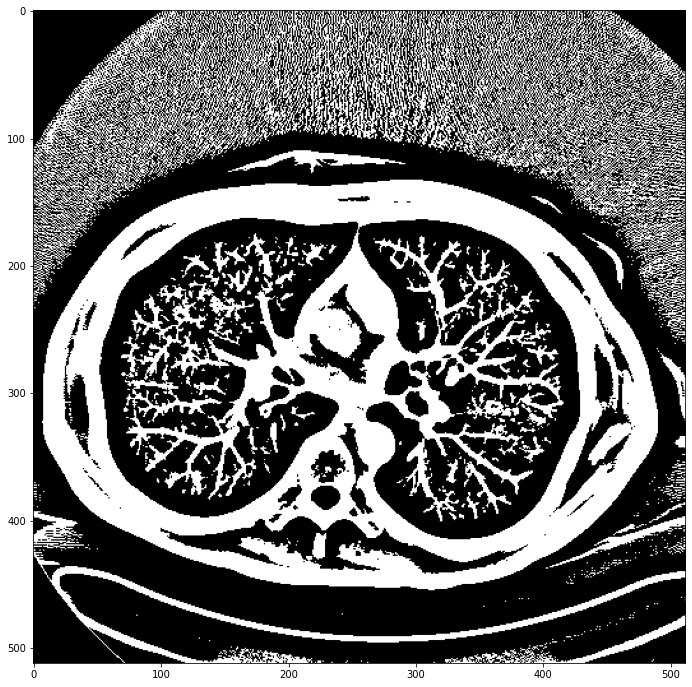

In [ ]:
segment_image = image > filters.threshold_local(image, 31, 'mean')
plt.figure(figsize = (12,12))
plt.imshow(segment_image, 'gray');

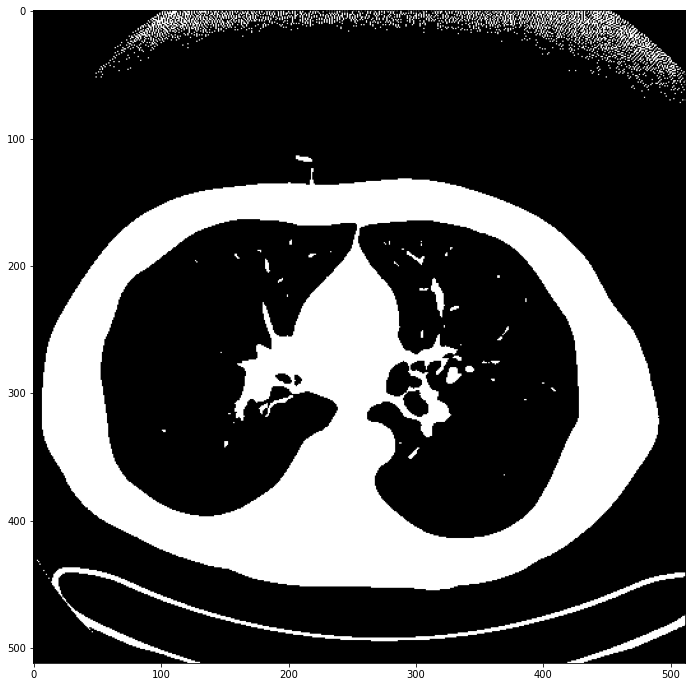

In [31]:
segment_image = image > filters.threshold_local(image, 255, 'mean')
plt.figure(figsize = (12,12))
plt.imshow(segment_image, 'gray');

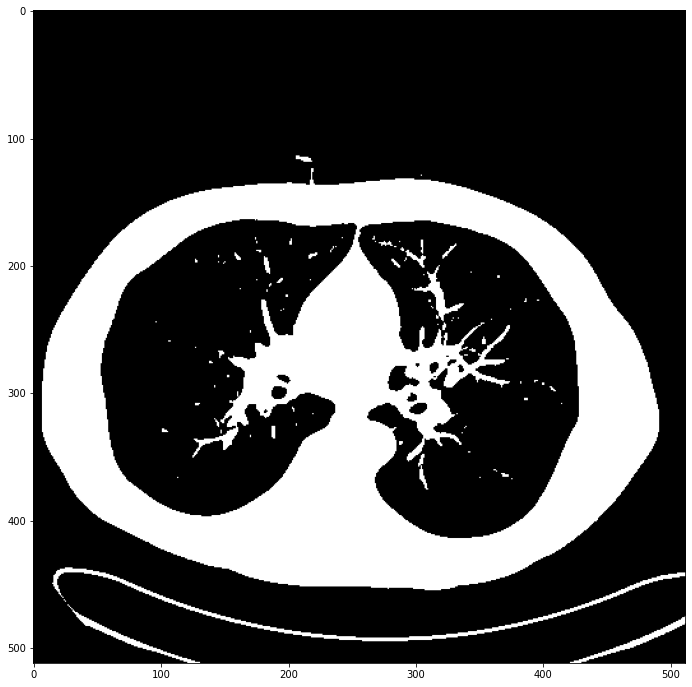

In [30]:
segment_image = image > filters.threshold_local(image, 511, 'mean')
plt.figure(figsize = (12,12))
plt.imshow(segment_image, 'gray');

data can find in 

https://www.kaggle.com/competitions/siim-isic-melanoma-classification=


In [ ]:
path = '/content/ISIC_0015719.dcm'

In [ ]:
dicom = pydicom.read_file(path)
dicom

/usr/local/lib/python3.7/dist-packages/pydicom/valuerep.py:290: UserWarning: Invalid value for VR UI: '"1.2.840.10008.5.1.4.1.1.77.1.4"'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/pydicom/valuerep.py:290: UserWarning: Invalid value for VR IS: '"1"'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)


Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 220
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: "1.2.840.10008.5.1.4.1.1.77.1.4"
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.5962.99.1.7166.2915.1589854541695.1.1.0.0.0
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.5962.99.2
(0002, 0013) Implementation Version Name         SH: 'PIXELMEDJAVA001'
(0002, 0016) Source Application Entity Title     AE: 'OURAETITLE'
-------------------------------------------------
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY']
(0008, 0014) Instance Creator UID                UI: 1.3.6.1.4.1.5962.99.3
(0008, 0016) SOP Class UID                       UI: "1.2.840.10008.5.1.4.1.1.77.1.4"
(0008, 0018) SOP Instance UID                    UI: 

In [ ]:
image = dicom.pixel_array
image

array([[[100, 102, 159],
        [100, 102, 160],
        [100, 102, 160],
        ...,
        [134, 109, 154],
        [133, 109, 155],
        [133, 109, 155]],

       [[101, 101, 159],
        [101, 101, 160],
        [101, 102, 160],
        ...,
        [135, 109, 154],
        [135, 109, 155],
        [135, 109, 155]],

       [[102, 101, 160],
        [102, 101, 160],
        [103, 101, 160],
        ...,
        [137, 109, 154],
        [137, 109, 155],
        [137, 109, 155]],

       ...,

       [[ 81, 109, 154],
        [ 81, 109, 154],
        [ 80, 109, 154],
        ...,
        [111, 108, 153],
        [111, 107, 153],
        [110, 107, 153]],

       [[ 80, 109, 154],
        [ 80, 109, 154],
        [ 80, 109, 154],
        ...,
        [111, 108, 153],
        [110, 107, 153],
        [111, 107, 153]],

       [[ 79, 109, 154],
        [ 79, 109, 154],
        [ 79, 109, 154],
        ...,
        [112, 108, 153],
        [112, 107, 153],
        [114, 107, 153]]

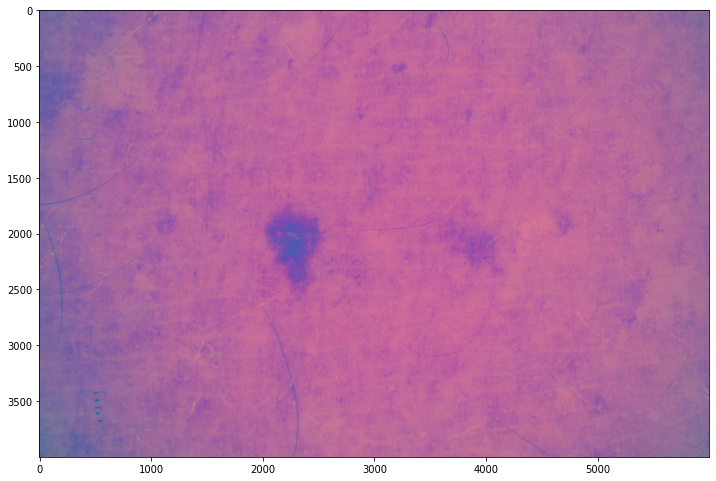

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(image);

In [ ]:
from skimage.color import rgb2gray

In [ ]:
gray_image = (rgb2gray(image))
gray_image.shape

(4000, 6000)

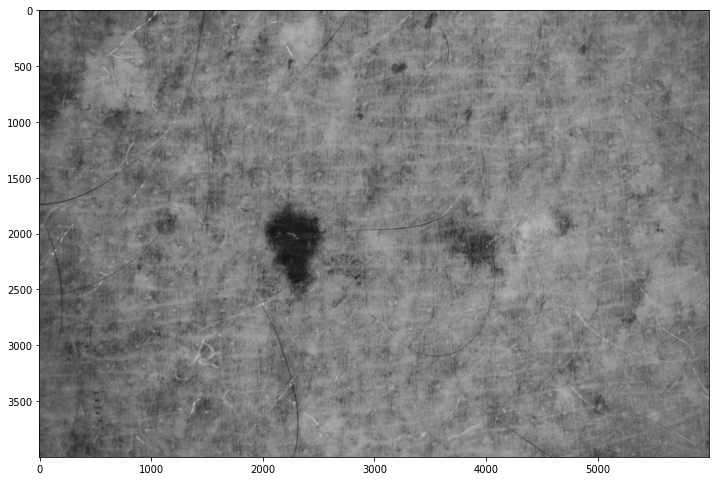

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(gray_image, 'gray');

In [ ]:
print(gray_image.min(), gray_image.max())

0.3256317647058823 0.6432317647058824


In [ ]:
histogram, bin_edges = np.histogram(gray_image, bins=256, range=(0, 1))

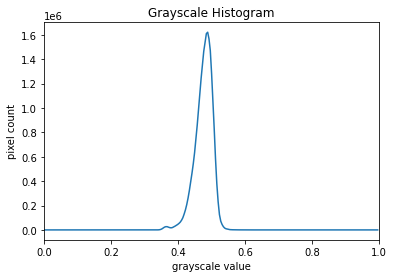

In [ ]:
# configure and draw the histogram figure
plt.figure()
plt.title("Grayscale Histogram")
plt.xlabel("grayscale value")
plt.ylabel("pixel count")
plt.xlim([0.0, 1.0])  # <- named arguments do not work here

plt.plot(bin_edges[0:-1], histogram)  # <- or here
plt.show()


In [ ]:
# otsu threshold
t = filters.threshold_otsu(gray_image)
print(f'threshold : {t}')
segment = np.where(gray_image > t,0,1)

threshold : 0.47016457720588234


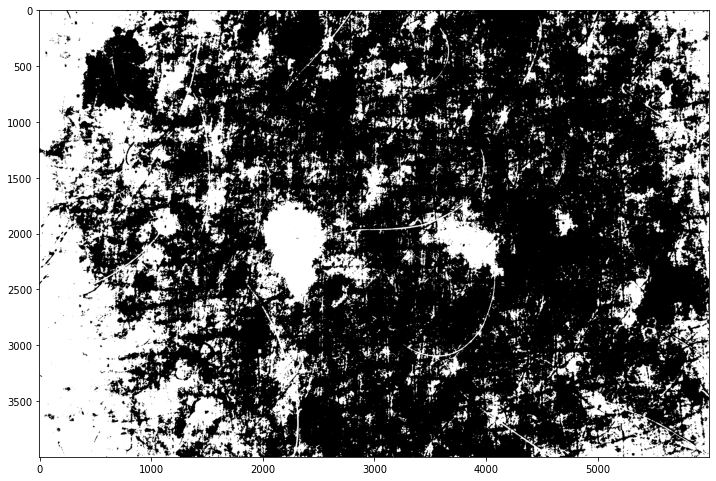

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(segment, 'gray');

In [ ]:
segment.shape

(4000, 6000)

In [ ]:
print(segment.min(), segment.max())

0 1


In [ ]:
segment_filter = np.stack((segment, segment,segment), axis=-1)
segment_filter.shape

(4000, 6000, 3)

In [ ]:
segment_image = np.multiply(image,segment_filter)

In [ ]:
print(f'red channel : {image[2000,4500,0]} , green channel : {image[2000,4500,1]} , blue channel : {image[2000,4500,2]}')

red channel : 208 , green channel : 113 , blue channel : 152


In [ ]:
print(f'segment : {segment[2000,4500]}')

segment : 0


In [ ]:
print(f'red channel segment image: {segment_image[2000,4500,0]} , green channel segment image : {segment_image[2000,4500,1]} , blue channel segment image : {segment_image[2000,4500,2]}')

red channel segment image: 0 , green channel segment image : 0 , blue channel segment image : 0


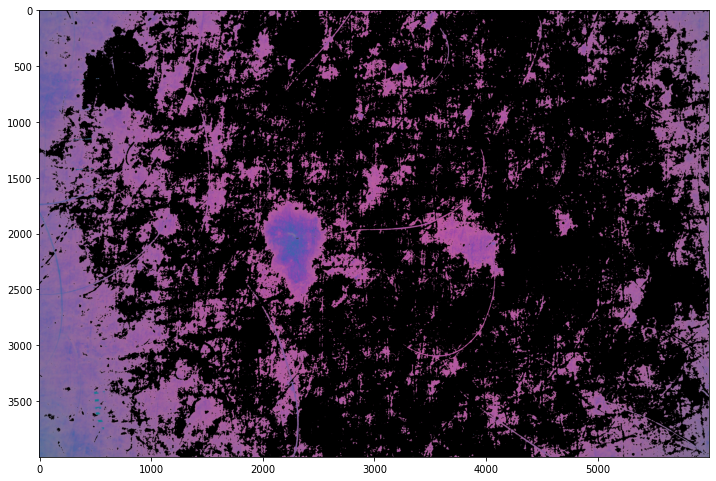

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(segment_image);

In [ ]:
# yen threshold
t = filters.threshold_yen(gray_image)
print(f'threshold : {t}')
segment = np.where(gray_image > t,0,1)

threshold : 0.4093739522058823


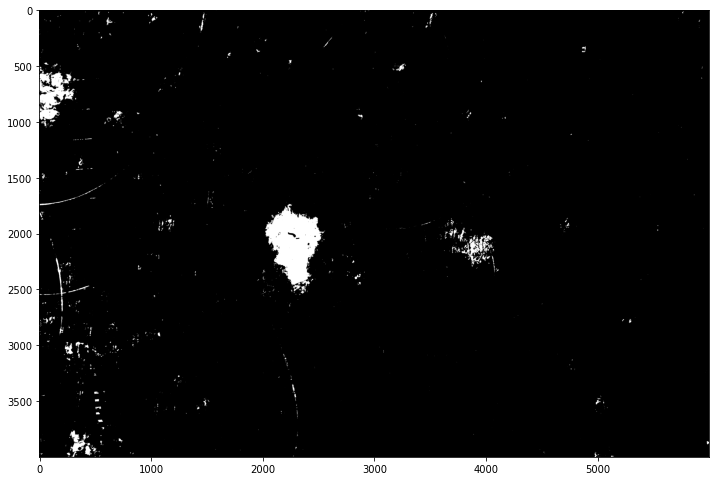

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(segment, 'gray');

In [ ]:
segment_filter = np.stack((segment, segment,segment), axis=-1)
segment_filter.shape

(4000, 6000, 3)

In [ ]:
segment_image = np.multiply(image,segment_filter)

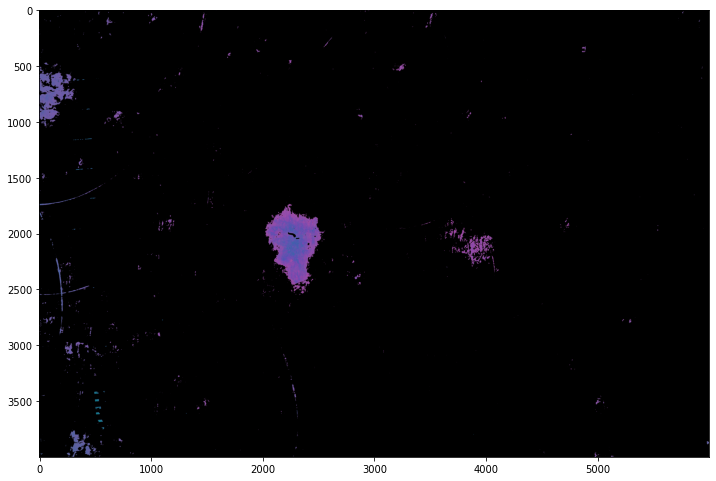

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(segment_image);

In [ ]:
plt.figure(figsize = (12,12))
plt.imshow(np.inverse(segment_image));

In [ ]:
def plot_segment_image(gray_image, filter_size):
    segment = gray_image < filters.threshold_local(gray_image, filter_size, 'mean')
    plt.figure(figsize = (7,7))
    plt.title(f'filter_size : {filter_size}')
    plt.imshow(segment, 'gray');

In [ ]:
smaller_gray_image = gray_image[::8, ::8]
smaller_gray_image.shape

(500, 750)

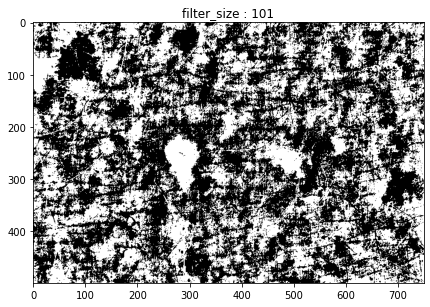

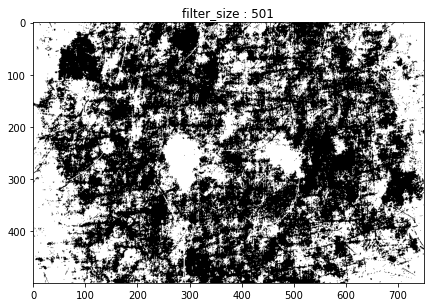

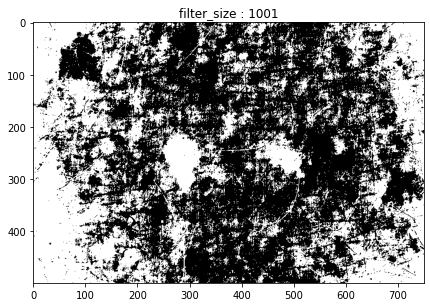

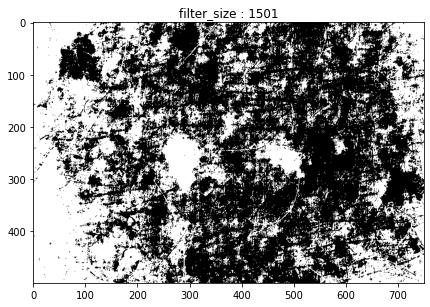

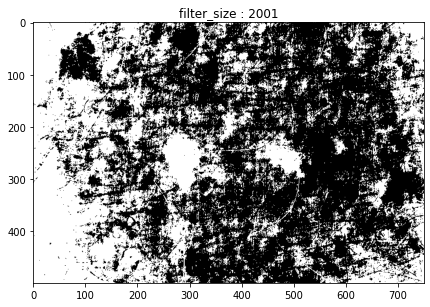

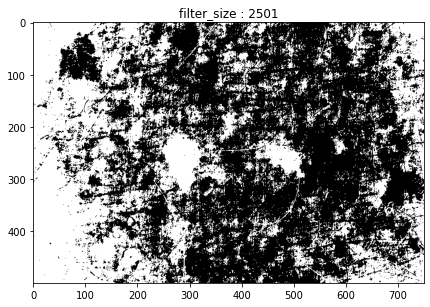

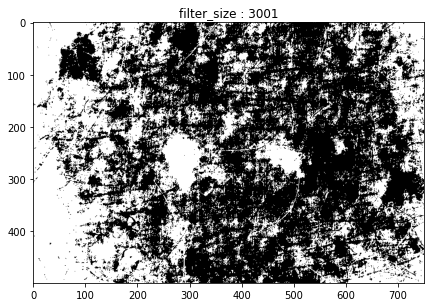

In [ ]:
for filter_size in [101,501,1001,1501,2001,2501,3001]:
    plot_segment_image(smaller_gray_image, filter_size)